In [1]:
!nvidia-smi

Fri Jan 17 17:46:14 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 566.36                 Driver Version: 566.36         CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650      WDDM  |   00000000:01:00.0  On |                  N/A |
| 70%   50C    P0             28W /   75W |    1053MiB /   4096MiB |      2%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import random as rd
import seaborn as sns
from skimage.transform import resize
from ultralytics import YOLO
import cv2 as cv
import imageio
from IPython.display import Image, Video


# Data preprocessing

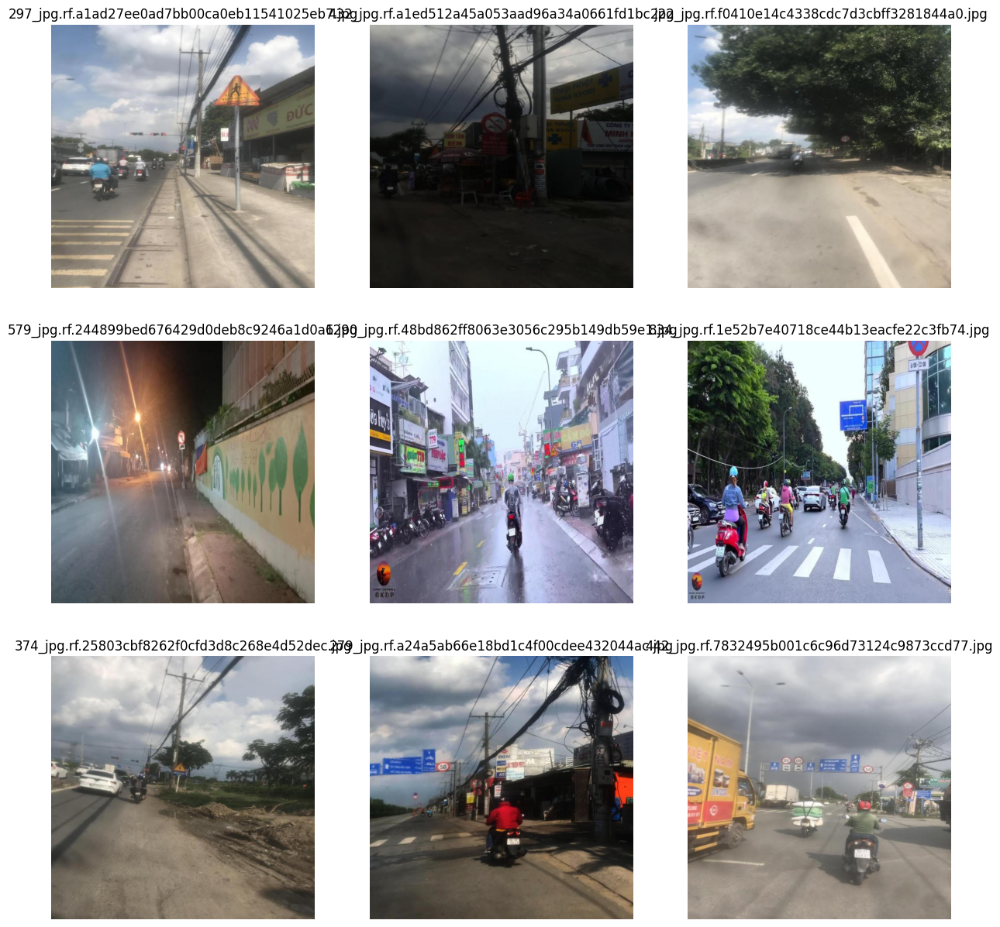

In [3]:
image_dir = './Vietnam-Traffic-Sign.v1i.yolov8/train/images'

num_samples = 9
image_files = os.listdir(image_dir)

rand_images = rd.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
for i in range(num_samples):
    img = rand_images[i]
    img_path = os.path.join(image_dir, img)
    ax = axes[i//3, i%3]
    # change to rgb
    ax.imshow(cv.cvtColor(cv.imread(img_path), cv.COLOR_BGR2RGB))
    ax.axis('off')
    ax.set_title(img)
plt.show()


# **Train**

In [3]:
# Build from YAML and transfer weights
Final_model = YOLO('yolov8n.pt')  

# Training The Final Model
Result_Final_model = Final_model.train(data="./Vietnam-Traffic-Sign.v1i.yolov8/data.yaml",epochs = 30, batch = -1, optimizer = 'auto')

Ultralytics 8.3.62  Python-3.12.1 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=./Vietnam-Traffic-Sign.v1i.yolov8/data.yaml, epochs=30, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train13, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=T

train: Scanning E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\Vietnam-Traffic-Sign.v1i.yolov8\train\labels... 3201 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3201/3201 [00:09<00:00, 332.64it/s]


train: New cache created: E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\Vietnam-Traffic-Sign.v1i.yolov8\train\labels.cache
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (NVIDIA GeForce GTX 1650) 4.00G total, 0.04G reserved, 0.02G allocated, 3.94G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
     3021378       8.251         0.971         155.7          1215        (1, 3, 640, 640)                    list
     3021378        16.5         1.218         26.93         123.7        (2, 3, 640, 640)                    list
     3021378          33         2.716         43.88         232.5        (4, 3, 640, 640)                    list
     3021378       66.01         3.982         78.45          3679        (8, 3, 640, 640)                    list
     3021378         132         4.616         147.6         428.9       (16, 3, 640, 640)              

train: Scanning E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\Vietnam-Traffic-Sign.v1i.yolov8\train\labels.cache... 3201 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3201/3201 [00:00<?, ?it/s]
val: Scanning E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\Vietnam-Traffic-Sign.v1i.yolov8\valid\labels.cache... 305 images, 0 backgrounds, 0 corrupt: 100%|██████████| 305/305 [00:00<?, ?it/s]


Plotting labels to E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\runs\detect\train13\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000172, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\runs\detect\train13
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.52G      1.416      5.418     0.9853          0        640: 100%|██████████| 801/801 [02:44<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:07<00:00,  5.37it/s]


                   all        305        932      0.576     0.0679     0.0551     0.0409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       2.5G      1.302      3.843     0.9332          9        640: 100%|██████████| 801/801 [02:08<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.38it/s]

                   all        305        932      0.454      0.169      0.113     0.0849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       2.5G      1.232        3.3     0.9229          1        640: 100%|██████████| 801/801 [02:11<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.69it/s]

                   all        305        932       0.47      0.202      0.167      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       2.5G      1.191      2.867     0.9152          6        640: 100%|██████████| 801/801 [02:16<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.97it/s]

                   all        305        932      0.495      0.229      0.208      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30       2.5G      1.138      2.607     0.9051          2        640: 100%|██████████| 801/801 [02:17<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.56it/s]


                   all        305        932      0.366      0.326      0.261      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       2.5G      1.115      2.356     0.9028          1        640: 100%|██████████| 801/801 [02:20<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.20it/s]

                   all        305        932      0.473      0.318      0.283      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       2.5G      1.106      2.208     0.8998          2        640: 100%|██████████| 801/801 [02:15<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.03it/s]

                   all        305        932      0.464      0.352      0.329      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       2.5G      1.084       2.08     0.8966          1        640: 100%|██████████| 801/801 [02:14<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.31it/s]

                   all        305        932      0.504       0.34      0.355      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       2.5G      1.064      1.992     0.8928          1        640: 100%|██████████| 801/801 [02:16<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.79it/s]


                   all        305        932      0.475      0.354      0.354      0.274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.49G      1.058      1.833     0.8887          2        640: 100%|██████████| 801/801 [02:17<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.30it/s]

                   all        305        932      0.564      0.335      0.394      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       2.5G      1.047      1.762     0.8906          7        640: 100%|██████████| 801/801 [02:12<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.17it/s]

                   all        305        932      0.424      0.447      0.412      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       2.5G       1.02      1.669     0.8827         33        640: 100%|██████████| 801/801 [02:18<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.03it/s]

                   all        305        932       0.52      0.406      0.417      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30       2.5G      1.013      1.588     0.8808          9        640: 100%|██████████| 801/801 [02:16<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.33it/s]

                   all        305        932      0.468      0.444      0.441      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.49G      1.009      1.531     0.8825          7        640: 100%|██████████| 801/801 [02:17<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.41it/s]

                   all        305        932      0.557        0.4       0.45      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30       2.5G      1.011      1.529     0.8789          1        640: 100%|██████████| 801/801 [02:19<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.34it/s]


                   all        305        932      0.595      0.409      0.476      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.52G     0.9926       1.47     0.8757          0        640: 100%|██████████| 801/801 [02:19<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.45it/s]

                   all        305        932      0.588      0.449      0.483      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       2.5G     0.9878      1.415     0.8779          2        640: 100%|██████████| 801/801 [02:17<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.93it/s]

                   all        305        932      0.464      0.514      0.485      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30       2.5G     0.9902      1.388     0.8756          2        640: 100%|██████████| 801/801 [02:12<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.96it/s]

                   all        305        932      0.594      0.436      0.483      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       2.5G      0.975      1.323     0.8715          1        640: 100%|██████████| 801/801 [02:12<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.03it/s]


                   all        305        932      0.536      0.502      0.504      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30       2.5G      0.973      1.324     0.8703          4        640: 100%|██████████| 801/801 [02:12<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.07it/s]

                   all        305        932      0.614      0.461      0.513        0.4


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       2.5G     0.9418      1.226     0.8698          5        640: 100%|██████████| 801/801 [02:12<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.69it/s]

                   all        305        932      0.614      0.453      0.521      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30       2.5G      0.937      1.197     0.8679          1        640: 100%|██████████| 801/801 [02:11<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.52it/s]


                   all        305        932      0.602      0.481      0.522      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       2.5G     0.9269      1.163     0.8656          1        640: 100%|██████████| 801/801 [02:08<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.61it/s]

                   all        305        932      0.593      0.497      0.528      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30       2.5G     0.9221       1.13     0.8617          1        640: 100%|██████████| 801/801 [02:09<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.90it/s]


                   all        305        932      0.589      0.508      0.534      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.49G     0.9227      1.128     0.8656          4        640: 100%|██████████| 801/801 [02:10<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:03<00:00,  9.94it/s]

                   all        305        932      0.594      0.493      0.536      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.49G     0.9141      1.094     0.8633          1        640: 100%|██████████| 801/801 [02:07<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.58it/s]


                   all        305        932      0.644      0.478      0.544      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30       2.5G     0.9017      1.081     0.8592          3        640: 100%|██████████| 801/801 [02:11<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.97it/s]

                   all        305        932      0.608      0.484      0.544      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30       2.5G     0.9013       1.06      0.861          2        640: 100%|██████████| 801/801 [02:17<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  8.92it/s]

                   all        305        932      0.572      0.509      0.545      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       2.5G     0.8974      1.047     0.8605          1        640: 100%|██████████| 801/801 [02:16<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:03<00:00,  9.82it/s]


                   all        305        932      0.604      0.496       0.55      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30       2.5G     0.8994      1.048     0.8589          7        640: 100%|██████████| 801/801 [02:10<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:04<00:00,  9.35it/s]


                   all        305        932      0.616      0.491       0.55      0.434

30 epochs completed in 1.183 hours.
Optimizer stripped from E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\runs\detect\train13\weights\last.pt, 6.3MB
Optimizer stripped from E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\runs\detect\train13\weights\best.pt, 6.3MB

Validating E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\runs\detect\train13\weights\best.pt...
Ultralytics 8.3.62  Python-3.12.1 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
Model summary (fused): 168 layers, 3,016,178 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:03<00:00, 10.20it/s]


                   all        305        932      0.616      0.493       0.55      0.434
cam_cac_loai_xe_3_banh         17         19      0.892      0.789      0.859       0.66
             cam_do_xe         65         67      0.883      0.791      0.872      0.674
  cam_dung_xe_va_do_xe         63         72        0.9      0.694       0.84      0.647
              cam_o_to         21         24      0.662      0.875      0.884      0.693
  cam_o_to_quay_dau_xe          4          4      0.271       0.25      0.306      0.245
      cam_o_to_re_phai          2          2      0.269          1      0.995      0.846
      cam_o_to_re_trai          6          6      0.792      0.833      0.792      0.615
          cam_o_to_tai         18         19        0.8      0.632       0.76      0.596
cam_o_to_tai_trong_luong_qua_10t          3          3          1      0.445      0.736      0.679
cam_o_to_tai_trong_luong_qua_2-5t          2          2          0          0      0.147      0.128


In [12]:
# !yolo task = detect mode = train model = yolov8n.pt data = config.yaml epochs=100 imgsz=640

# **Đánh giá mô hình**

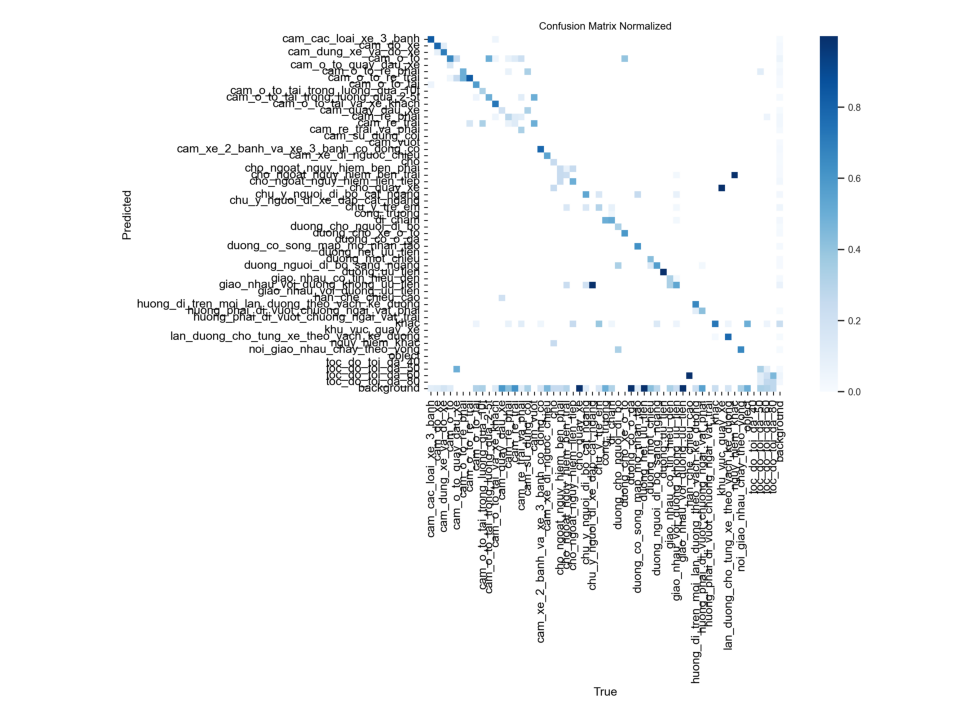

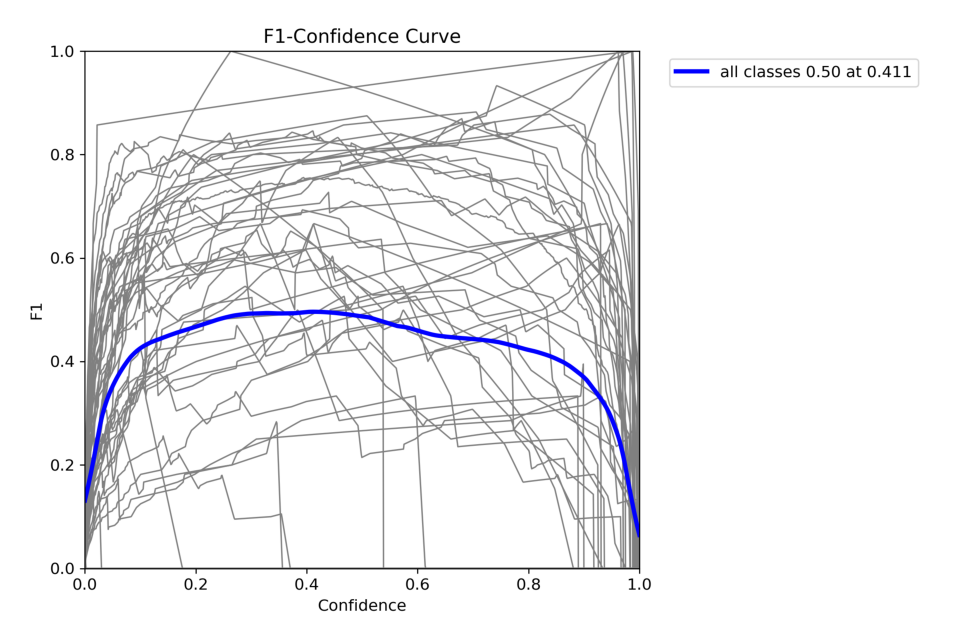

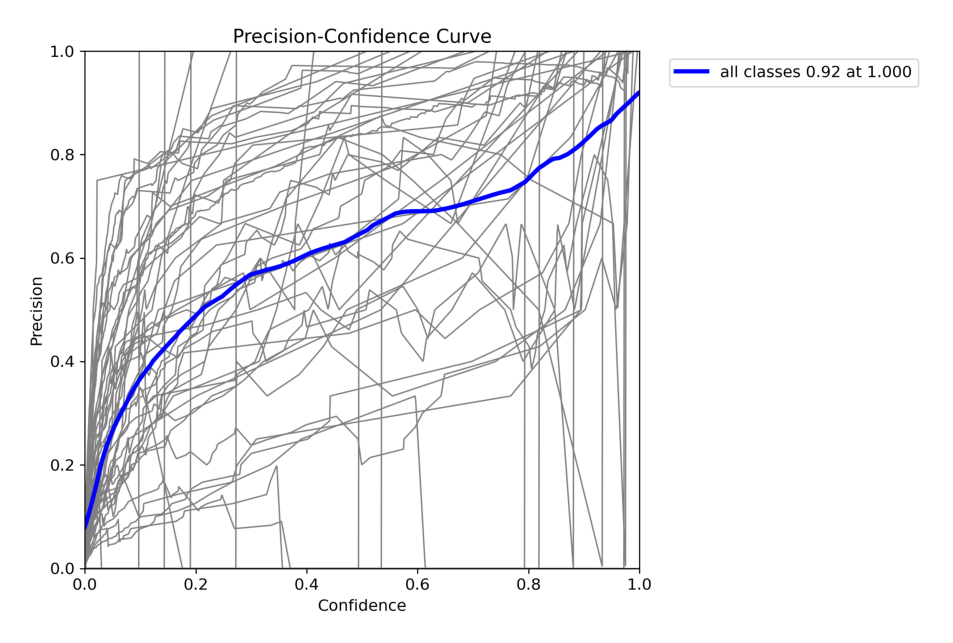

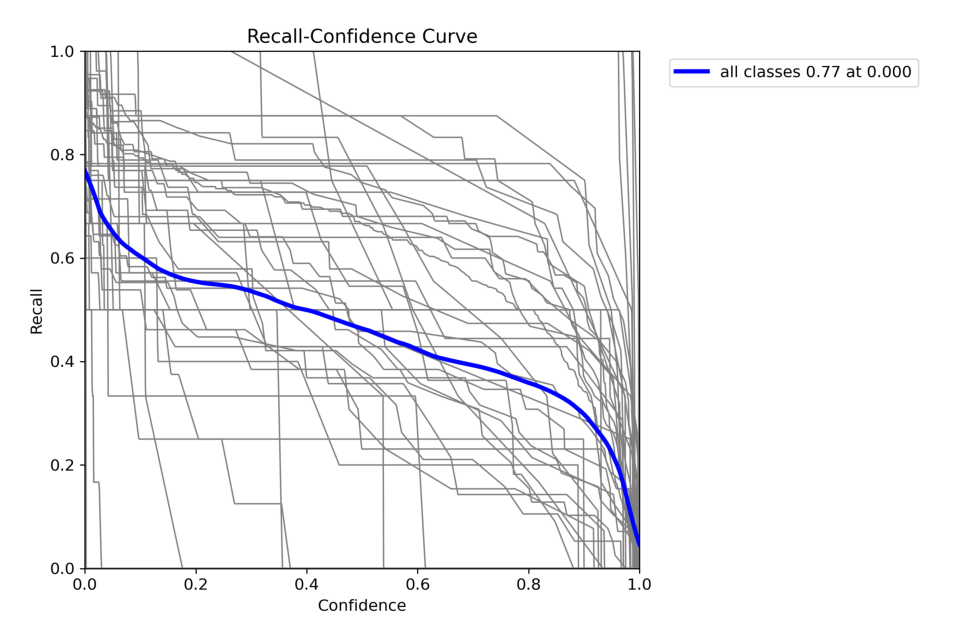

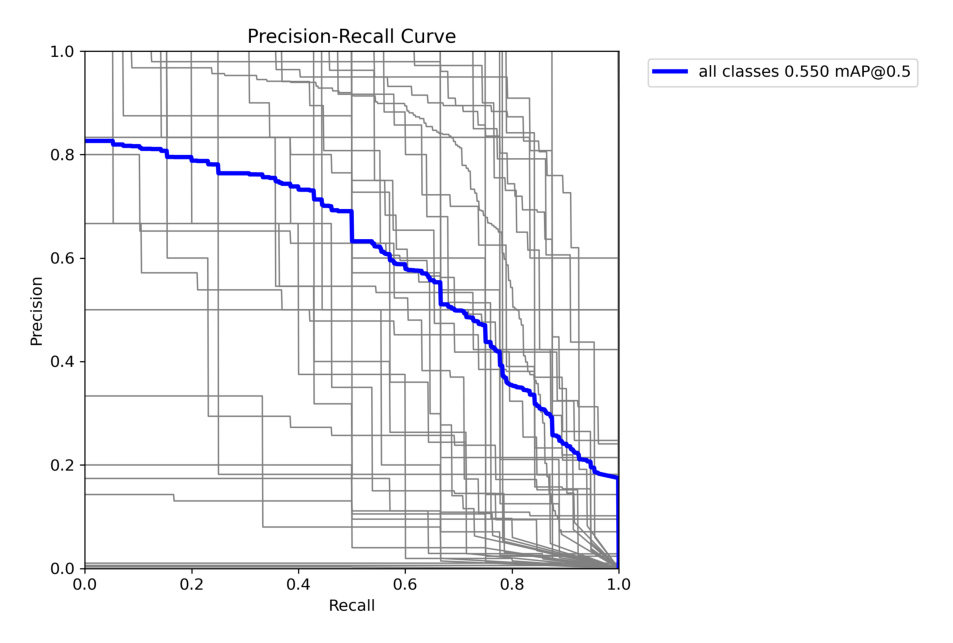

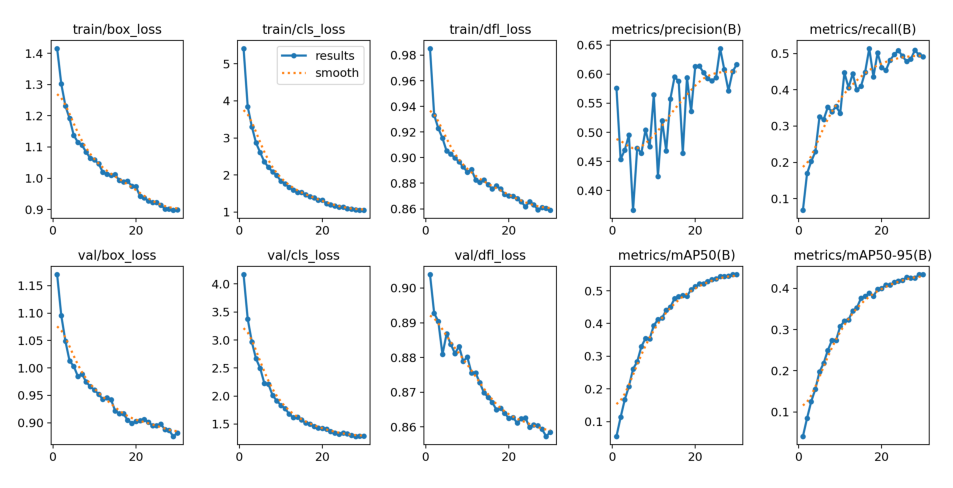

In [4]:
def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = './runs/detect/train13'

# Display the images
display_images(post_training_files_path, image_files)

In [5]:
Result_Final_model = pd.read_csv('./runs/detect/train13/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
20,21,3034.76,0.94183,1.22579,0.86984,0.61363,0.45340,0.52089,0.40851,0.90390,1.40839,0.86275,0.000058,0.000058,0.000058
21,22,3170.93,0.93703,1.19708,0.86790,0.60241,0.48092,0.52165,0.40779,0.90610,1.36964,0.86114,0.000053,0.000053,0.000053
22,23,3303.68,0.92690,1.16277,0.86564,0.59253,0.49703,0.52821,0.41479,0.90129,1.34288,0.86236,0.000047,0.000047,0.000047
23,24,3437.92,0.92212,1.12964,0.86169,0.58863,0.50827,0.53394,0.41740,0.89506,1.31953,0.86257,0.000041,0.000041,0.000041
24,25,3572.49,0.92272,1.12849,0.86558,0.59356,0.49284,0.53634,0.41942,0.89454,1.33681,0.85990,0.000036,0.000036,0.000036
25,26,3704.88,0.91407,1.09442,0.86332,0.64410,0.47777,0.54426,0.42723,0.89751,1.32446,0.86060,0.000030,0.000030,0.000030
26,27,3840.86,0.90174,1.08058,0.85922,0.60755,0.48423,0.54377,0.42549,0.88763,1.29552,0.86040,0.000024,0.000024,0.000024
27,28,3982.95,0.90127,1.06015,0.86105,0.57152,0.50911,0.54519,0.42531,0.88607,1.28017,0.85934,0.000019,0.000019,0.000019
28,29,4124.05,0.89742,1.04658,0.86051,0.60438,0.49586,0.54977,0.43332,0.87521,1.28302,0.85727,0.000013,0.000013,0.000013
29,30,4259.17,0.89936,1.04822,0.85892,0.61642,0.49102,0.54977,0.43356,0.88151,1.28534,0.85851,0.000007,0.000007,0.000007


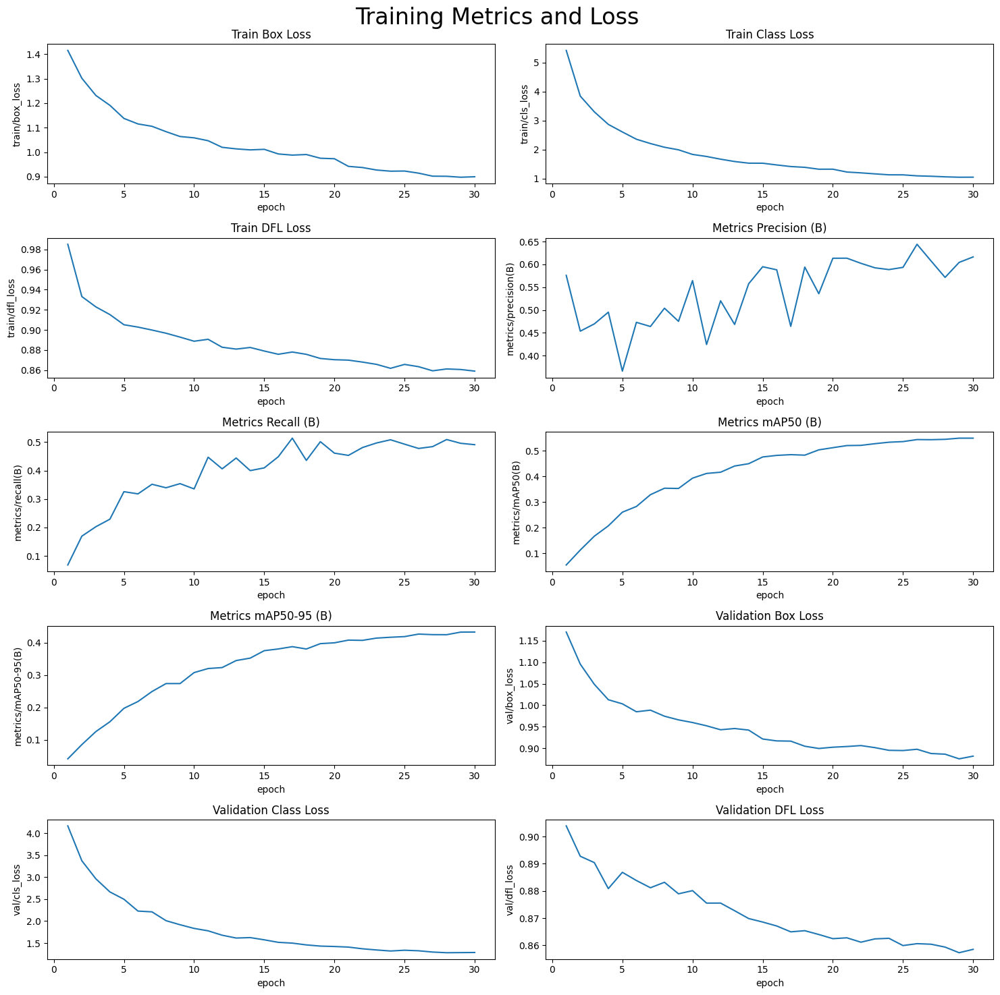

In [6]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [5]:
# Loading the best performing model
Valid_model = YOLO('./runs/detect/train13/weights/best.pt')
# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.62  Python-3.12.1 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
Model summary (fused): 168 layers, 3,016,178 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning E:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\Vietnam-Traffic-Sign.v1i.yolov8\valid\labels.cache... 305 images, 0 backgrounds, 0 corrupt: 100%|██████████| 305/305 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.76it/s]


                   all        305        932      0.616      0.493       0.55      0.434
cam_cac_loai_xe_3_banh         17         19      0.892      0.789      0.859       0.66
             cam_do_xe         65         67      0.883      0.791      0.872      0.674
  cam_dung_xe_va_do_xe         63         72        0.9      0.694       0.84      0.647
              cam_o_to         21         24      0.662      0.875      0.884      0.693
  cam_o_to_quay_dau_xe          4          4      0.271       0.25      0.306      0.245
      cam_o_to_re_phai          2          2      0.269          1      0.995      0.846
      cam_o_to_re_trai          6          6      0.792      0.833      0.792      0.615
          cam_o_to_tai         18         19        0.8      0.632       0.76      0.596
cam_o_to_tai_trong_luong_qua_10t          3          3          1      0.445      0.736      0.679
cam_o_to_tai_trong_luong_qua_2-5t          2          2          0          0      0.147      0.128



0: 640x640 1 cam_cac_loai_xe_3_banh, 1 khac, 12.0ms
Speed: 13.9ms preprocess, 12.0ms inference, 96.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 cam_do_xe, 1 cam_o_to, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 chu_y_nguoi_di_bo_cat_ngang, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 cam_do_xe, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 18.0ms
Speed: 3.0ms preprocess, 18.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 cho_ngoat_nguy_hiem_ben_phai, 15.0ms
Speed: 2.0ms preprocess, 15.0ms inference, 20.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 chu_y_nguoi_di_bo_cat_ngang, 1 giao_nhau_co_tin_hieu_den, 2 toc_do_toi_da_50s, 14.9ms
Speed: 2.0ms preprocess, 14.9ms inference, 2.0ms 

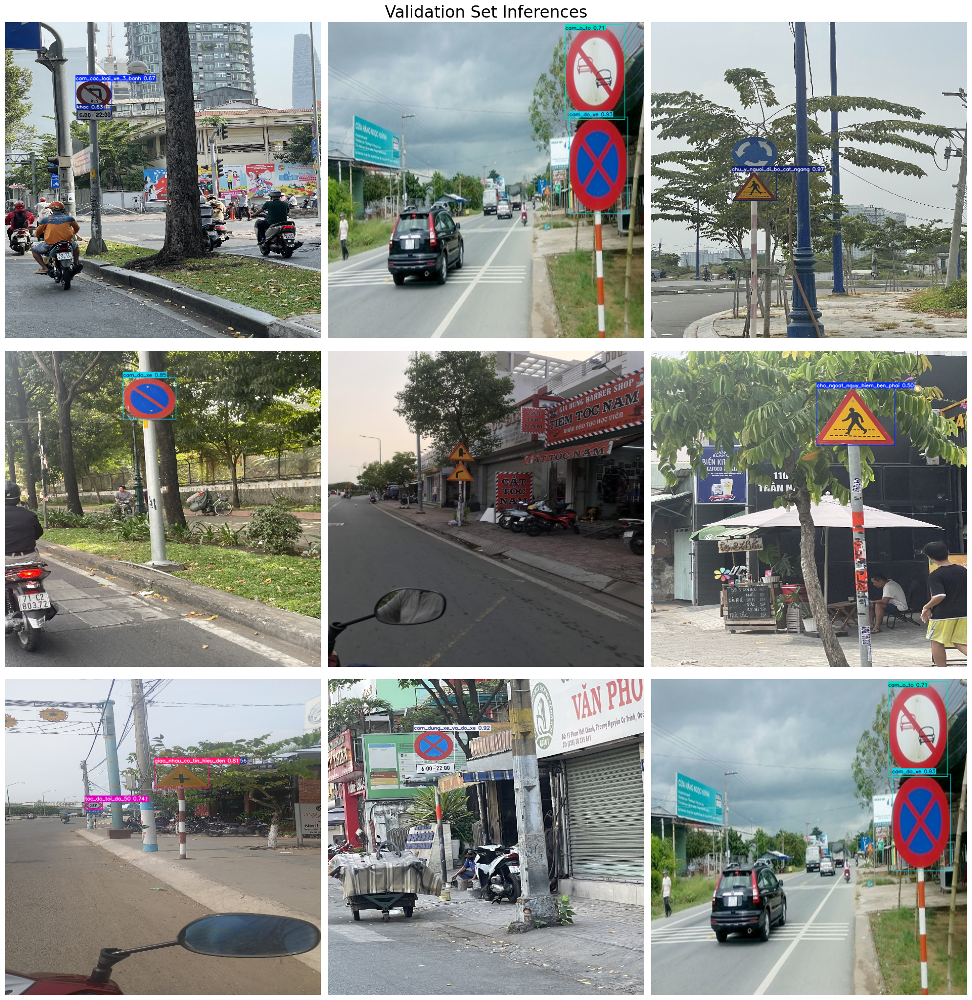

In [6]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
valid_images_path = './train/images'

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Detect traffic signs from video

In [7]:
vid = './IMG_1129.mov'
Video(vid, width=640, height=640)

In [8]:
Valid_model.predict(source=vid, imgsz=640, conf=0.5, show=True, save = True)



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1047) e:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\IMG_1129.mov: 640x384 1 cam_o_to, 2 khacs, 216.3ms
video 1/1 (frame 2/1047) e:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\IMG_1129.mov: 640x384 2 khacs, 7.0ms
video 1/1 (frame 3/1047) e:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\IMG_1129.mov: 640x384 2 khacs, 7.0ms
video 1/1 (frame 4/1047) e:\LapTrinh\PROJECT\ML\xulyanh\traffic signs detection\IMG_1129.mov:

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'cam_cac_loai_xe_3_banh', 1: 'cam_do_xe', 2: 'cam_dung_xe_va_do_xe', 3: 'cam_o_to', 4: 'cam_o_to_quay_dau_xe', 5: 'cam_o_to_re_phai', 6: 'cam_o_to_re_trai', 7: 'cam_o_to_tai', 8: 'cam_o_to_tai_trong_luong_qua_10t', 9: 'cam_o_to_tai_trong_luong_qua_2-5t', 10: 'cam_o_to_tai_va_xe_khach', 11: 'cam_quay_dau_xe', 12: 'cam_re_phai', 13: 'cam_re_trai', 14: 'cam_re_trai_va_phai', 15: 'cam_su_dung_coi', 16: 'cam_vuot', 17: 'cam_xe_2_banh_va_xe_3_banh_co_dong_co', 18: 'cam_xe_di_nguoc_chieu', 19: 'cho', 20: 'cho_ngoat_nguy_hiem_ben_phai', 21: 'cho_ngoat_nguy_hiem_ben_trai', 22: 'cho_ngoat_nguy_hiem_lien_tiep', 23: 'cho_quay_xe', 24: 'chu_y_nguoi_di_bo_cat_ngang', 25: 'chu_y_nguoi_di_xe_dap_cat_ngang', 26: 'chu_y_tre_em', 27: 'cong_truong', 28: 'di_cham', 29: 'duong_cho_nguoi_di_bo', 30: 'duong_cho_xe_o_to', 31: 'duong_co_o_ga', 32: 'duong_co_song

In [ ]:
Video('./runs/detect/predict2/IMG_1129.mov', width=640, height=640)